In [69]:
!pip install pytorch_tabnet

In [70]:
import pytorch_tabnet
from pytorch_tabnet.tab_model import TabNetRegressor
import torch
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.model_selection import train_test_split,KFold
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rcParams
%matplotlib inline
rcParams['figure.figsize'] = 10,8
sns.set(style='whitegrid', palette='muted',
        rc={'figure.figsize': (15,10)})
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
from numpy.random import seed
from keras.layers import BatchNormalization
import pandas as pd
import numpy as np

In [71]:
# using data that I prprocessed in the earlier assignments
data = pd.read_csv("../input/processedwids-data/data.csv")
test_data = pd.read_csv("../input/processedwids-data/test_data.csv")

In [72]:
X = data.drop(['site_eui'] , axis = 1)
y = data['site_eui']

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [74]:
# log1p -> log of (1+x)
y_train_log1p = np.log1p(y_train)
X_train_new = X_train.to_numpy()
y_train_new = y_train_log1p.to_numpy().reshape(-1, 1)
X_test = X_test.to_numpy()

In [75]:
test_id = test_data['id']
test_data.drop(['id'],axis = 1,inplace = True)

In [76]:
test_data.shape

(9705, 54)

In [77]:
new_test_data = test_data.to_numpy()

In [78]:
# using tabnet to predict the site_eui
# doing a KFold validation on the training and test sets
# here taking a max_epoch as 50 and rmse as a evaluation matrix to fit the data on TabNet
# taking a mean of the predictions for as the final prediction
kf = KFold(n_splits=5, random_state=42, shuffle=True)
predictions_array =[]
CV_score_array    =[]
for train_index, test_index in kf.split(X_train_new):
    X_train_kf, X_valid_kf = X_train_new[train_index], X_train_new[test_index]
    y_train_kf, y_valid_kf = y_train_new[train_index], y_train_new[test_index]
    regressor = TabNetRegressor(seed=42)
    regressor.fit(X_train=X_train_kf, y_train=y_train_kf,
              eval_set=[(X_valid_kf, y_valid_kf)],
              patience=300, max_epochs=50,
              eval_metric=['rmse'])
    CV_score_array.append(regressor.best_cost)
    predictions_array.append(np.expm1(regressor.predict(X_test)))

predictions = np.mean(predictions_array,axis=0)

Device used : cpu
epoch 0  | loss: 3.95987 | val_0_rmse: 4.30634 |  0:00:03s
epoch 1  | loss: 0.4265  | val_0_rmse: 2.6222  |  0:00:07s
epoch 2  | loss: 0.38573 | val_0_rmse: 0.73306 |  0:00:11s
epoch 3  | loss: 0.36833 | val_0_rmse: 0.83437 |  0:00:15s
epoch 4  | loss: 0.36195 | val_0_rmse: 0.79899 |  0:00:19s
epoch 5  | loss: 0.3605  | val_0_rmse: 0.81547 |  0:00:23s
epoch 6  | loss: 0.35824 | val_0_rmse: 0.65375 |  0:00:27s
epoch 7  | loss: 0.35953 | val_0_rmse: 0.61908 |  0:00:31s
epoch 8  | loss: 0.35652 | val_0_rmse: 0.6336  |  0:00:35s
epoch 9  | loss: 0.35267 | val_0_rmse: 0.60876 |  0:00:39s
epoch 10 | loss: 0.35253 | val_0_rmse: 0.60415 |  0:00:43s
epoch 11 | loss: 0.34887 | val_0_rmse: 0.59133 |  0:00:47s
epoch 12 | loss: 0.34689 | val_0_rmse: 0.59427 |  0:00:51s
epoch 13 | loss: 0.34456 | val_0_rmse: 0.59505 |  0:00:55s
epoch 14 | loss: 0.34094 | val_0_rmse: 0.58475 |  0:00:59s
epoch 15 | loss: 0.33958 | val_0_rmse: 0.58258 |  0:01:04s
epoch 16 | loss: 0.33821 | val_0_rmse:

In [79]:
print("The CV score is %.5f" % np.mean(CV_score_array,axis=0))

The CV score is 0.57135


In [80]:
# predicting the test data, here taking expm1 -> returns E^x - 1.
# because earlier we took logp1 of the data
final_pred = np.expm1(regressor.predict(new_test_data))

In [81]:
# creating a submission file
sub = pd.concat([test_id,pd.Series(final_pred[:,0] , name = 'site_eui')],axis = 1)
sub.to_csv('submission.csv',index = False)

In [82]:
from keras.metrics import RootMeanSquaredError as rmse
from keras.metrics import MeanAbsoluteError as mae
import keras.metrics as metrics

In [83]:
# 2. creating a Neural Network for Tabular Data
# activation function for each layer -> relu

model = Sequential()
model.add(Dense(units=64, activation='relu', input_dim=X_train.shape[1]))
model.add(BatchNormalization())
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(units=16, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.2))


# create output layer
model.add(Dense(1))


# compiling a model with RMSprop optimizer
model.compile(optimizer='RMSprop', loss='mse', metrics=[metrics.MeanAbsoluteError(), metrics.RootMeanSquaredError()])

# model summary
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_56 (Dense)             (None, 64)                3520      
_________________________________________________________________
batch_normalization_28 (Batc (None, 64)                256       
_________________________________________________________________
dense_57 (Dense)             (None, 32)                2080      
_________________________________________________________________
dropout_28 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_58 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_29 (Batc (None, 16)                64        
_________________________________________________________________
dropout_29 (Dropout)         (None, 16)              

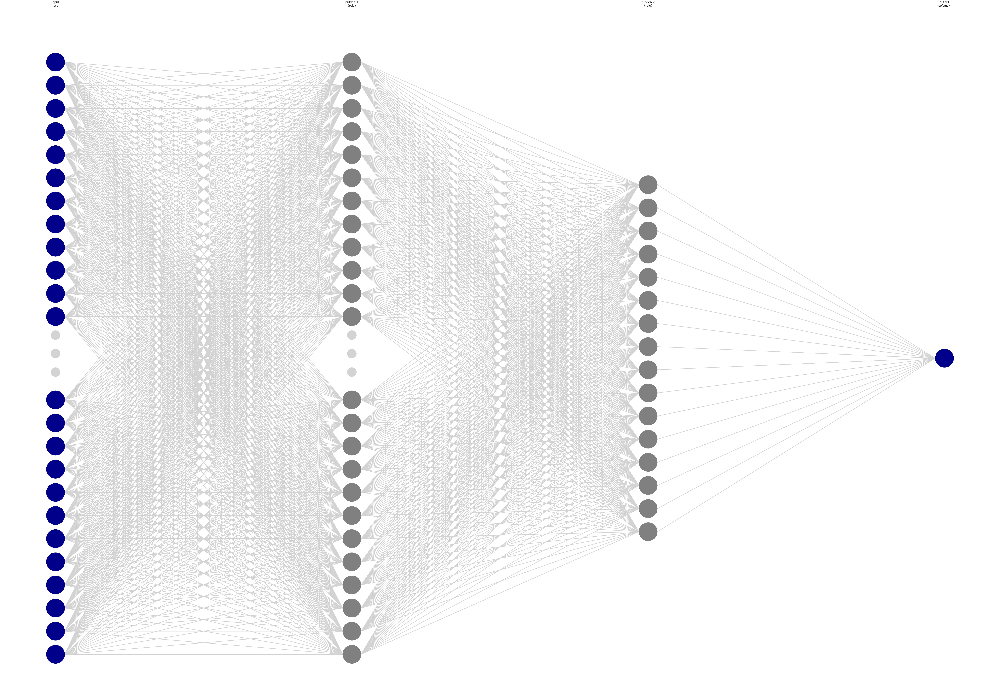

(<Figure size 14400x7200 with 1 Axes>, <AxesSubplot:>)

In [94]:
!pip install nnv
from nnv import NNV
plt.rcParams['figure.figsize'] = (200,100)
layerslist = [
    {"title" : "input\n(relu)" , "units" : 64 , "color":"darkBlue"},
    {"title" : "hidden 1\n(relu)" , "units" : 32},
    {"title" : "hidden 2\n(relu)" , "units" : 16},
    {"title" : "output\n(softmax)" , "units" : 1, "color" : "darkBlue"}
]
NNV(layerslist,max_num_nodes_visible = 25,node_radius = 2,spacing_layer = 60,font_size = 24).render()

In [84]:
# avaoiding overfitting of the model by taking less epochs
training = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
1269/1269 [==============================] - 5s 3ms/step - loss: 8563.1562 - mean_absolute_error: 71.8225 - root_mean_squared_error: 92.5373 - val_loss: 7622.1802 - val_mean_absolute_error: 67.5504 - val_root_mean_squared_error: 87.3051
Epoch 2/10
1269/1269 [==============================] - 4s 3ms/step - loss: 4242.5723 - mean_absolute_error: 38.6245 - root_mean_squared_error: 65.1350 - val_loss: 3196.6775 - val_mean_absolute_error: 32.1621 - val_root_mean_squared_error: 56.5392
Epoch 3/10
1269/1269 [==============================] - 4s 3ms/step - loss: 3475.9014 - mean_absolute_error: 33.7814 - root_mean_squared_error: 58.9568 - val_loss: 3222.4731 - val_mean_absolute_error: 32.0691 - val_root_mean_squared_error: 56.7668
Epoch 4/10
1269/1269 [==============================] - 4s 3ms/step - loss: 3454.6440 - mean_absolute_error: 33.6759 - root_mean_squared_error: 58.7762 - val_loss: 3171.0081 - val_mean_absolute_error: 32.4053 - val_root_mean_squared_error: 56.3117
Epoch 5/

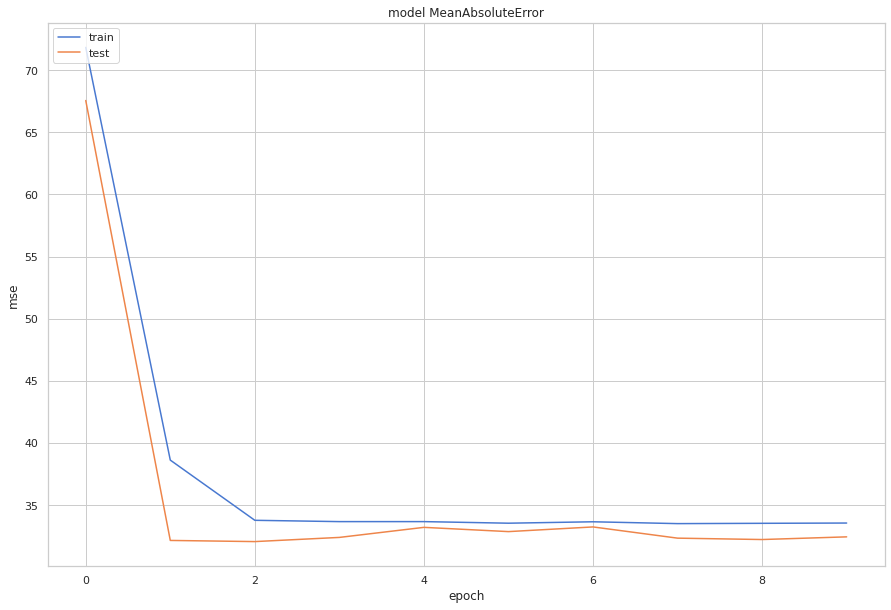

In [85]:
# summarize history for mse
plt.plot(training.history['mean_absolute_error'])
plt.plot(training.history['val_mean_absolute_error'])
plt.title('model MeanAbsoluteError')
plt.ylabel('mse')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

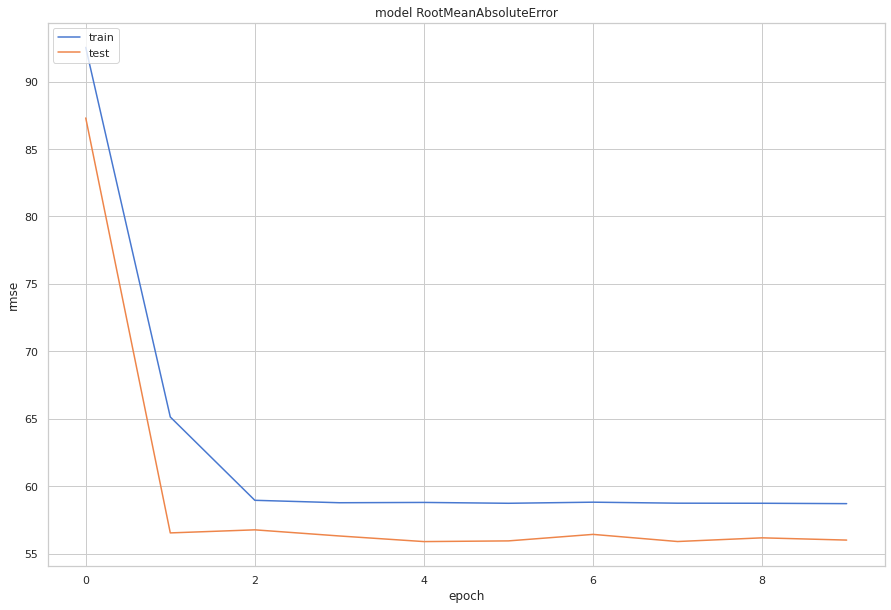

In [86]:
plt.plot(training.history['root_mean_squared_error'])
plt.plot(training.history['val_root_mean_squared_error'])
plt.title('model RootMeanAbsoluteError')
plt.ylabel('rmse')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [87]:
# predicting on the test data
from sklearn.metrics import mean_absolute_error
test_error=mean_absolute_error(model.predict(X_test), y_test)
print("The mean absolute error on the test set is :" +" "+ str(test_error))

The mean absolute error on the test set is : 33.58816953822268


In [88]:
X_new = X.to_numpy()
y_new = np.log1p(y)
y_new = y_new.to_numpy().reshape(-1, 1)

In [89]:
training_final = model.fit(X, y, epochs=10, batch_size=32, validation_split=0.2)

Epoch 1/10
1894/1894 [==============================] - 6s 3ms/step - loss: 3181.7185 - mean_absolute_error: 32.2467 - root_mean_squared_error: 56.4067 - val_loss: 4245.5132 - val_mean_absolute_error: 41.2639 - val_root_mean_squared_error: 65.1576
Epoch 2/10
1894/1894 [==============================] - 6s 3ms/step - loss: 3179.2249 - mean_absolute_error: 32.2070 - root_mean_squared_error: 56.3846 - val_loss: 4425.9575 - val_mean_absolute_error: 43.5164 - val_root_mean_squared_error: 66.5279
Epoch 3/10
1894/1894 [==============================] - 6s 3ms/step - loss: 3169.4785 - mean_absolute_error: 32.2361 - root_mean_squared_error: 56.2981 - val_loss: 4468.7339 - val_mean_absolute_error: 43.1416 - val_root_mean_squared_error: 66.8486
Epoch 4/10
1894/1894 [==============================] - 6s 3ms/step - loss: 3177.8203 - mean_absolute_error: 32.2320 - root_mean_squared_error: 56.3722 - val_loss: 4310.6426 - val_mean_absolute_error: 42.7634 - val_root_mean_squared_error: 65.6555
Epoch 5/

In [90]:
y_pred_sub_nn = model.predict(new_test_data)

In [91]:
sub = pd.concat([test_id,pd.Series(y_pred_sub_nn[:,0], name = 'site_eui')],axis = 1)
sub.to_csv('submission.csv',index = False)

In [92]:
# TabNet result on Kaggle competetion
# Score: 58.788
# Private score: 59.474

# Model created using NN
# Score: 62.737
# Public score: 61.121

In [93]:
'''
Summary:
Used a preprocessed data from previous assignments
Recorded the performance of the TabNet using KFold cross validation
Created a NN using Keras and plotted the mse vs epochs and rmse vs epochs plots to capture the perfomance of model on tarining and test sets.
'''

'\nSummary:\nUsed a preprocessed data from previous assignments\nRecorded the performance of the TabNet using KFold cross validation\nCreated a NN using Keras and plotted the mse vs epochs and rmse vs epochs plots to capture the perfomance of model on tarining and test sets.\n'